In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
from PIL import Image
import requests
import ipyplot
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS
from matplotlib import rcParams
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
import folium
from folium.plugins import HeatMap

In [3]:
df_ja = pd.read_csv('dataset/jp_actress_info.csv', index_col=[0])
print(df_ja.shape)
df_ja.head()

(1220, 12)


,Name,Image_URL,Birthday,Blood_Type,Breast_Size,Waist_Size,Height,Number_HD_Video_Online,Cup_Size,Hips,Home_Town,Hobby
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,10/28/1993,O,83,60,168,5,C,83.0,埼玉県,"スポーツ,料理"
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,09/22/1989,O,87,55,169,26,D,85.0,東京都,"ゲーム,美味しい店を探す,料理"
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,10/29/1995,NaN,83,59,156,7,NaN,NaN,NaN,NaN
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,03/18/1998,NaN,80,56,149,3,NaN,NaN,NaN,NaN
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,05/15/1995,O,86,58,153,17,NaN,NaN,NaN,NaN


In [4]:
df_ja.dropna(how='all', inplace=True)
df_ja.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1220 entries, 0 to 1219
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    1220 non-null   object 
 1   Image_URL               1220 non-null   object 
 2   Birthday                1143 non-null   object 
 3   Blood_Type              608 non-null    object 
 4   Breast_Size             1220 non-null   object 
 5   Waist_Size              1220 non-null   object 
 6   Height                  1220 non-null   object 
 7   Number_HD_Video_Online  1220 non-null   int64  
 8   Cup_Size                342 non-null    object 
 9   Hips                    406 non-null    float64
 10  Home_Town               293 non-null    object 
 11  Hobby                   343 non-null    object 
dtypes: float64(1), int64(1), object(10)
memory usage: 123.9+ KB


In [5]:
# df_ja['height'] = df_ja['height'].apply(lambda x: x[:-2] if pd.isnull(x) == False else x)
# df_ja['bust'] = df_ja['bust'].apply(lambda x: x[:-2] if pd.isnull(x) == False else x)
# df_ja['waist'] = df_ja['waist'].apply(lambda x: x[:-2] if pd.isnull(x) == False else x)
# df_ja['hips'] = df_ja['hips'].apply(lambda x: x[:-2] if pd.isnull(x) == False else x)
# df_ja.head(5)

In [6]:
print('--- Check feature by feature ---')
print('*'*50)

for fe in df_ja.columns:
    print('-'*20)
    print(df_ja[fe].value_counts())

--- Check feature by feature ---
**************************************************
--------------------
堀内未果子    2
浅倉愛      1
新山らん     1
中澤レイ     1
久留木玲     1
        ..
恵けい      1
真梨邑ケイ    1
谷田部和沙    1
麻生香月     1
長谷川柚月    1
Name: Name, Length: 1219, dtype: int64
--------------------
https://javmodel.com/javdata/uploads/hinami_narusawa150.jpg     2
https://javmodel.com/javdata/uploads/ai_asakura150.jpg          1
https://javmodel.com/javdata/uploads/ran_niiyama150.jpg         1
https://javmodel.com/javdata/uploads/rei_nakazawa150.jpg        1
https://javmodel.com/javdata/uploads/rei_kuruki150.jpg          1
                                                               ..
https://javmodel.com/javdata/uploads/kei_megumi150.jpg          1
https://javmodel.com/javdata/uploads/kei_marimura150.jpg        1
https://javmodel.com/javdata/uploads/kazusa_yatabe150.jpg       1
https://javmodel.com/javdata/uploads/kazuki_asou150.jpg         1
https://javmodel.com/javdata/uploads/yuzuki_hasegawa15

# EDA Age

In [7]:
df_age = df_ja[['Name', 'Image_URL', 'Birthday']]
# convert birthday to datetime and drop NaN
df_age['Birthday'] = pd.to_datetime(df_age['Birthday'], errors='coerce')
df_age = df_age.dropna(subset=['Birthday'])
# add Age feature
df_age['Age'] = df_age['Birthday'].apply(lambda x: pd.to_datetime('today').year - x.year)
print(df_age.shape)
df_age.head()

(1141, 4)


,Name,Image_URL,Birthday,Age
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,1993-10-28,28
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,1989-09-22,32
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,1995-10-29,26
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,1998-03-18,23
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,1995-05-15,26


In [8]:
# plot distplot Age feature
dist_data = df_age[df_age['Age'].notnull()]
fig = ff.create_distplot([dist_data['Age']], group_labels = ['Age of JA'])
fig.update_layout(margin=dict(t=30, b=30, l=30, r=30))
fig.show()

In [9]:
# plot violin chart for Age feature
fig = go.Figure(data=go.Violin(
                                y=df_age['Age'], 
                                box_visible=True, 
                                line_color='red',
                                meanline_visible=True, 
                                opacity=0.5,
                                x0='Age',
                                points='all'
                            )
                )

fig.update_layout(
                    height=600,
                    margin=dict(t=30, b=30, l=30, r=30)
                )
fig.show()

406    真梨邑ケイ
Name: Name, dtype: object



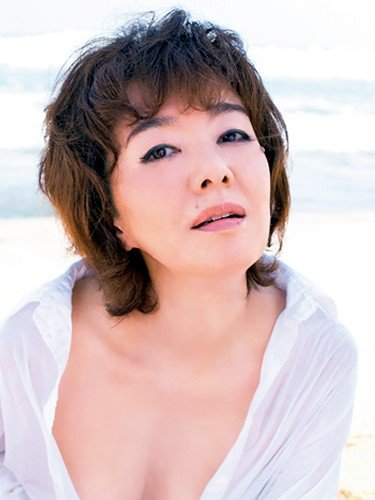


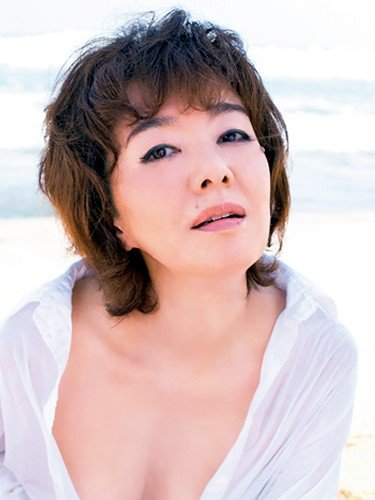

In [10]:
df_age_max = df_age[df_age['Age'] == 64]
print(df_age_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_age_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

64      あまつか亜夢
262      朝田ひまり
802        北城希
858       小野六花
1045     和知すばる
1094      天ノうた
Name: Name, dtype: object



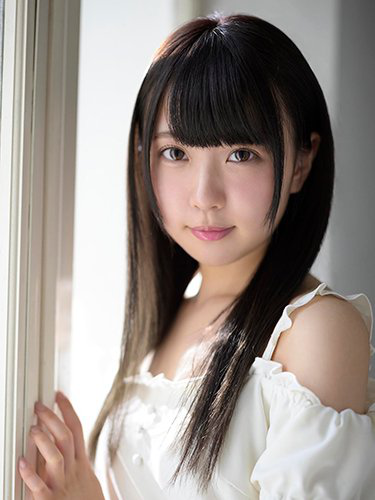
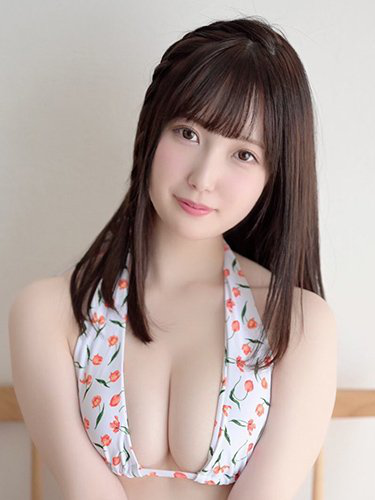
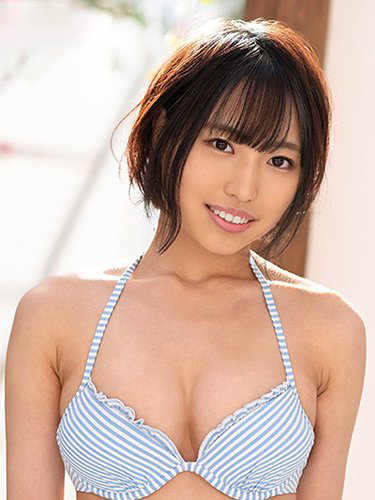
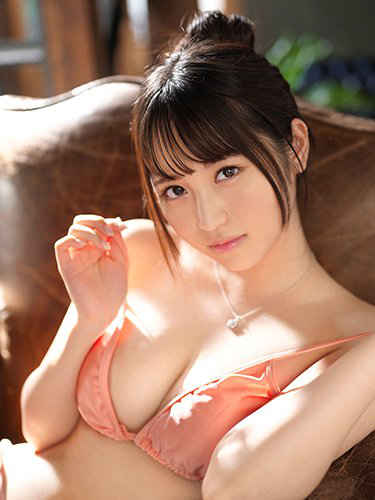
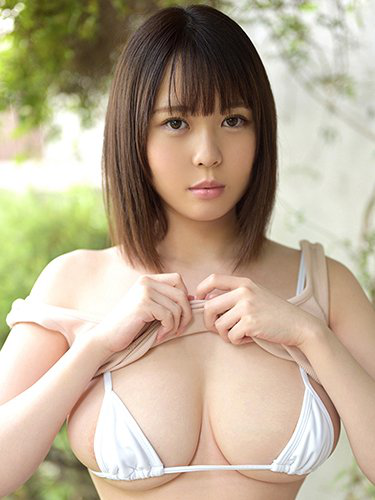
...
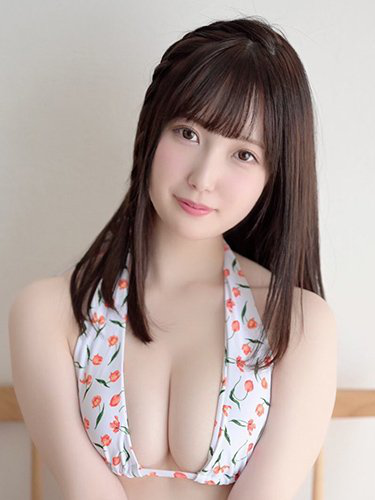
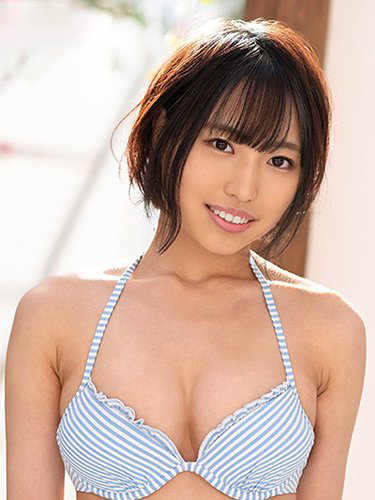
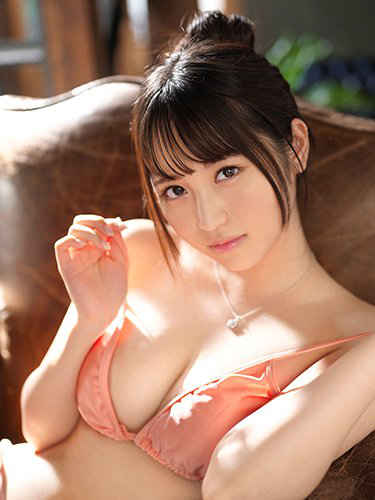
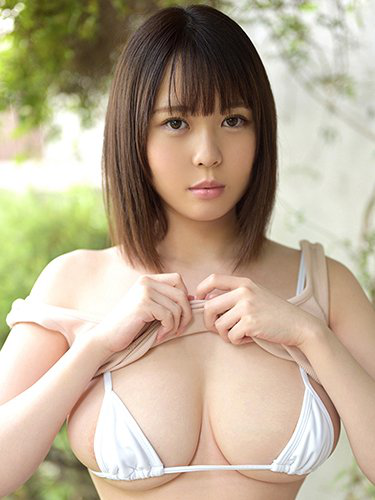
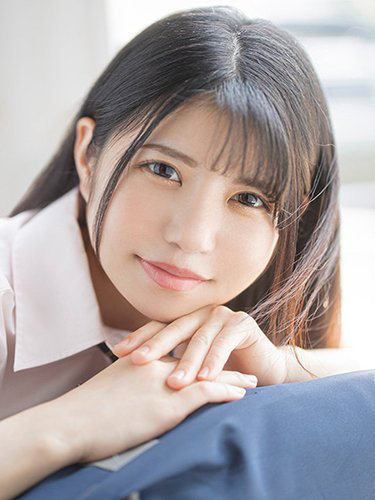

In [11]:
df_age_min = df_age[df_age['Age'] == 19]
print(df_age_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_age_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

In [12]:
# function convert birthday to zodiac sign
def zodiac_sign(day, month):
     
    # checks month and date within the valid range of a specified zodiac
    if month == 12:
        astro_sign = 'Sagittarius' if (day < 22) else 'Capricorn'
         
    elif month == 1:
        astro_sign = 'Capricorn' if (day < 20) else 'Aquarius'
         
    elif month == 2:
        astro_sign = 'Aquarius' if (day < 19) else 'Pisces'
         
    elif month == 3:
        astro_sign = 'Pisces' if (day < 21) else 'Aries'
         
    elif month == 4:
        astro_sign = 'Aries' if (day < 20) else 'Taurus'
         
    elif month == 5:
        astro_sign = 'Taurus' if (day < 21) else 'Gemini'
         
    elif month == 6:
        astro_sign = 'Gemini' if (day < 21) else 'Cancer'
         
    elif month == 7:
        astro_sign = 'Cancer' if (day < 23) else 'Leo'
         
    elif month == 8:
        astro_sign = 'Leo' if (day < 23) else 'Virgo'
         
    elif month == 9:
        astro_sign = 'Virgo' if (day < 23) else 'Libra'
         
    elif month == 10:
        astro_sign = 'Libra' if (day < 23) else 'Scorpio'
         
    elif month == 11:
        astro_sign = 'scorpio' if (day < 22) else 'Sagittarius'
    
    else:
        astro_sign = np.nan
    
    return astro_sign

In [13]:
df_age['Zodiac_Sign'] = df_age['Birthday'].apply(lambda x: zodiac_sign(x.day, x.month))
df_age.head()

,Name,Image_URL,Birthday,Age,Zodiac_Sign
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,1993-10-28,28,Scorpio
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,1989-09-22,32,Virgo
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,1995-10-29,26,Scorpio
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,1998-03-18,23,Pisces
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,1995-05-15,26,Taurus


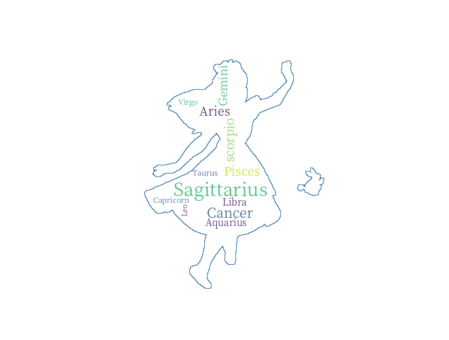

In [14]:
# create a zodiac sign wordcloud
zodiac_signs = ' '.join(df_age['Zodiac_Sign'])
font_path = 'font/NotoSerifCJKjp-Light.otf'
mask = np.array(Image.open('alice_mask.png'))

stopwords = set(STOPWORDS)
stopwords.add("です")
stopwords.add("する")

wordcloud = WordCloud(background_color='white',
               mask=mask,
               font_path=font_path,
               max_words=2000,
               contour_width=1,
               contour_color='steelblue',
               stopwords=stopwords,
               max_font_size=500
               ).generate(zodiac_signs)
wordcloud.to_file("zodiac.png")

# show wordcloud
plt.figure(figsize=(8,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# EDA Breast size, Waist size, and Hip size

In [15]:
df_bwh = df_ja[['Name', 'Image_URL', 'Breast_Size', 'Waist_Size', 'Hips']]
df_bwh.drop(df_bwh.index[df_bwh["Breast_Size"].apply(lambda x: not (x.strip().isnumeric()))], axis=0, inplace=True)
df_bwh.drop(df_bwh.index[df_bwh["Waist_Size"].apply(lambda x: not (x.strip().isnumeric()))], axis=0, inplace=True)

df_bwh['Breast_Size'] = df_bwh['Breast_Size'].astype(np.float32)
df_bwh['Waist_Size'] = df_bwh['Waist_Size'].astype(np.float32)

print(df_bwh.shape)
df_bwh.head()

(1161, 5)


,Name,Image_URL,Breast_Size,Waist_Size,Hips
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,83.0,60.0,83.0
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,87.0,55.0,85.0
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,83.0,59.0,NaN
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,80.0,56.0,NaN
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,86.0,58.0,NaN


In [16]:
# remove outlier
df_bwh = df_bwh[df_bwh['Waist_Size'] < 80]
df_bwh = df_bwh[df_bwh['Breast_Size'] > 40]
print(df_bwh.shape)
df_bwh.head()

(1157, 5)


,Name,Image_URL,Breast_Size,Waist_Size,Hips
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,83.0,60.0,83.0
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,87.0,55.0,85.0
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,83.0,59.0,NaN
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,80.0,56.0,NaN
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,86.0,58.0,NaN


In [17]:
fig = go.Figure()
for fe in ['Breast_Size', 'Waist_Size', 'Hips']:
    fig.add_trace(go.Violin(x=[fe]*df_bwh.shape[0],
                            y=df_bwh[fe],
                            text='Dist plot for ' + fe.upper(),
                            name=fe.upper(),
                            box_visible=True,
                            meanline_visible=True,
                            points='all'))

fig.update_layout(
                    height=800,
                    margin=dict(t=30, b=30, l=30, r=30)
                )
fig.show()

526    白石茉莉奈
Name: Name, dtype: object



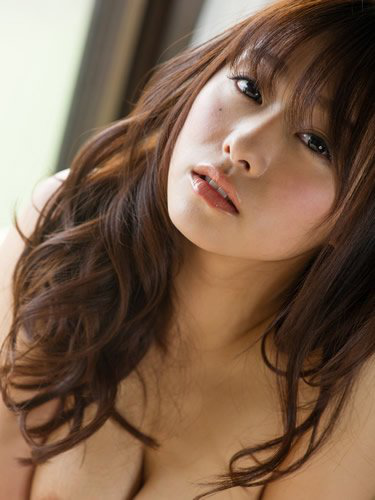


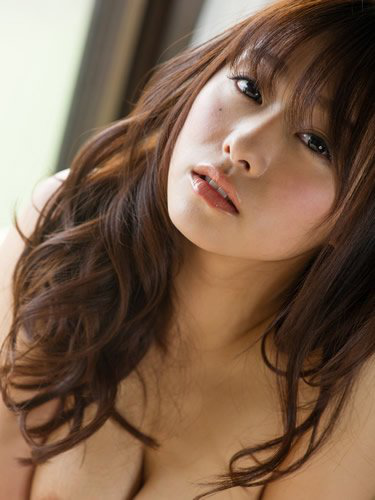

In [18]:
df_bwh_standard = df_bwh[(df_bwh['Breast_Size'] == 90) & (df_bwh['Waist_Size'] == 60) & (df_bwh['Hips'] == 90)]
print(df_bwh_standard.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_bwh_standard['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

44        吉沢明歩
215     藤井シェリー
923       水樹りさ
959       初美沙希
1014      向井しほ
Name: Name, dtype: object



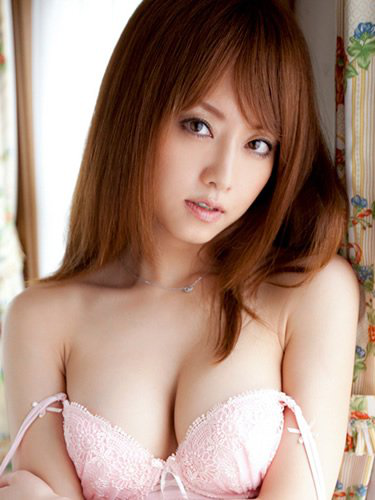
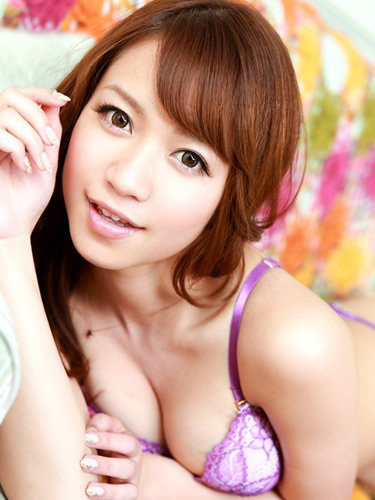
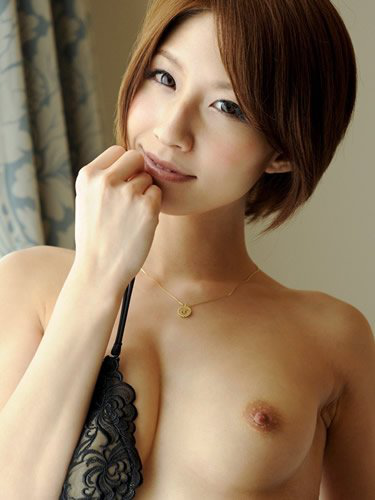
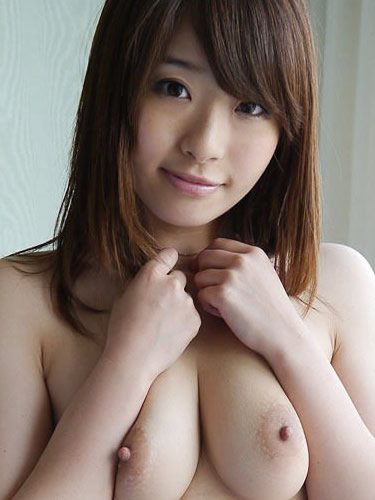
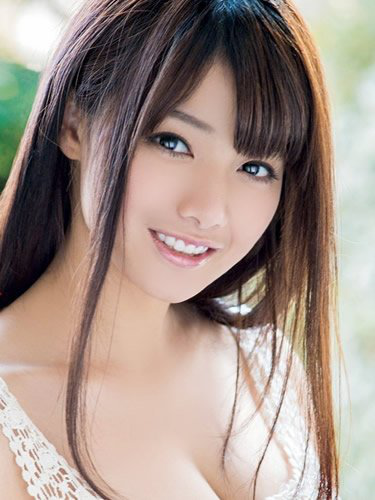


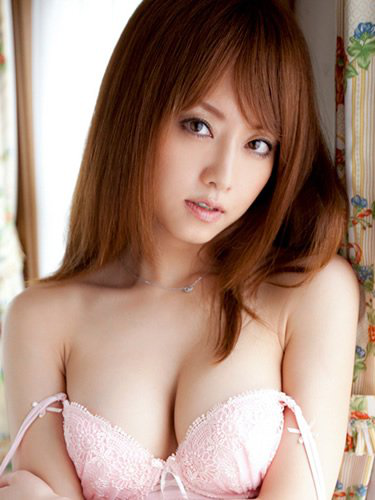
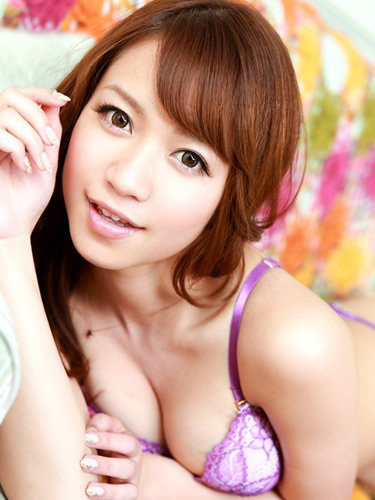
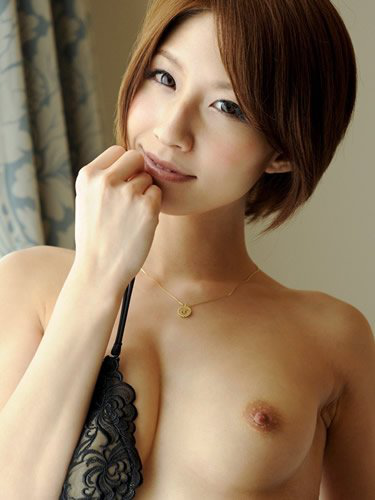
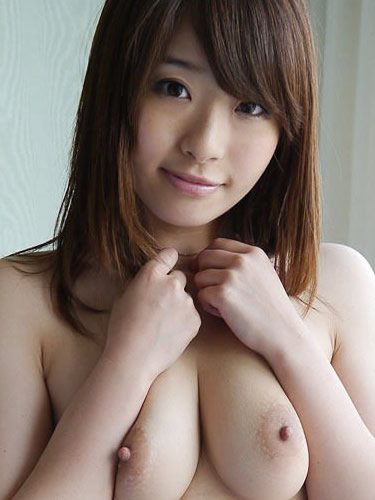
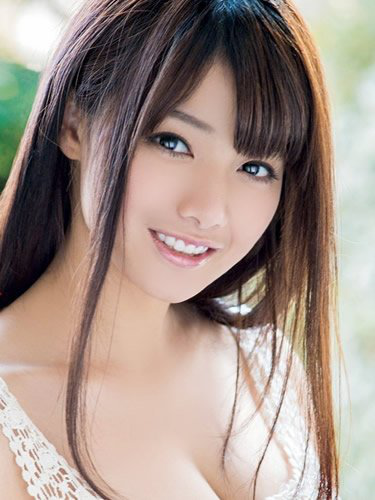

In [19]:
df_bwh_mean = df_bwh[(df_bwh['Breast_Size'] == 86) & (df_bwh['Waist_Size'] == 58) & (df_bwh['Hips'] == 86)]
print(df_bwh_mean.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_bwh_mean['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

519    夢野まりあ
Name: Name, dtype: object



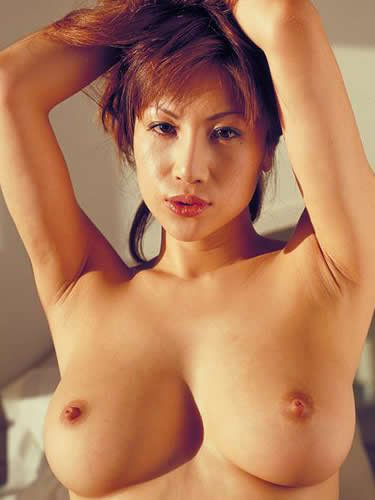


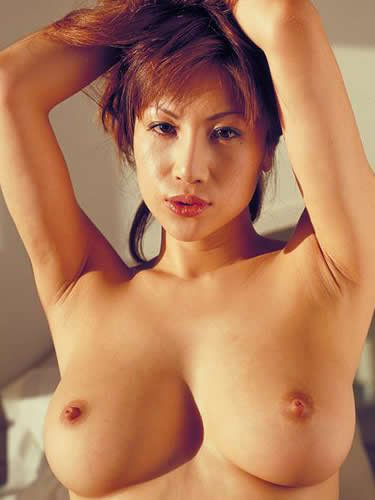

In [20]:
df_breast_max = df_bwh[df_bwh['Breast_Size'] == 115]
print(df_breast_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_breast_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

544     裕木まゆ
619    小谷みのり
Name: Name, dtype: object



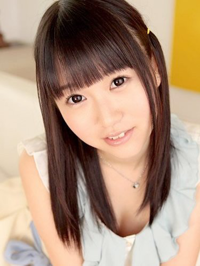
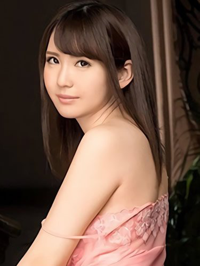


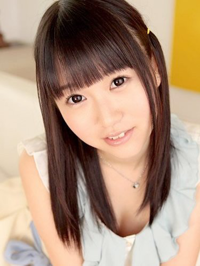
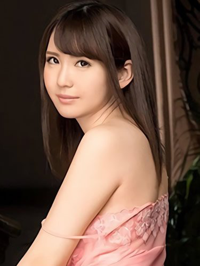

In [21]:
df_breast_min = df_bwh[df_bwh['Breast_Size'] == 72]
print(df_breast_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_breast_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=200)

608     星宮みなみ
953      宮部涼花
1199    吉根ゆりあ
Name: Name, dtype: object



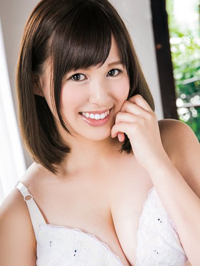
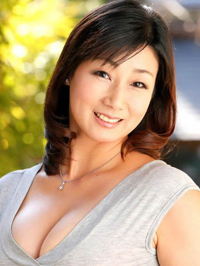
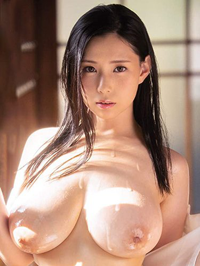


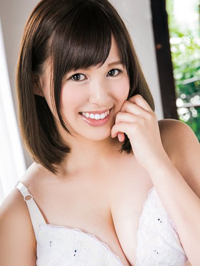
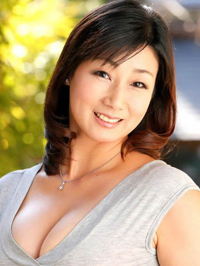
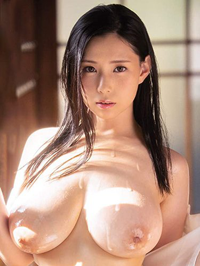

In [22]:
df_waist_max = df_bwh[df_bwh['Waist_Size'] == 70]
print(df_waist_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_waist_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=200)

442    もりの小鳥
Name: Name, dtype: object



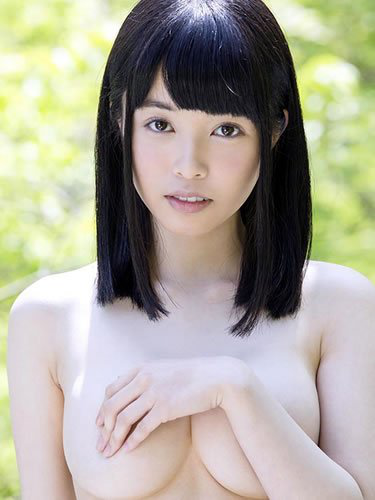


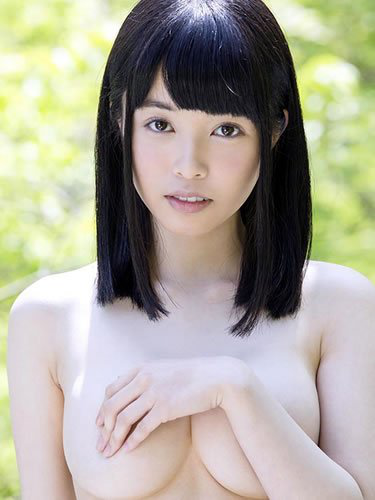

In [23]:
df_waist_min = df_bwh[df_bwh['Waist_Size'] == 49]
print(df_waist_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_waist_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

409    小口田桂子
Name: Name, dtype: object



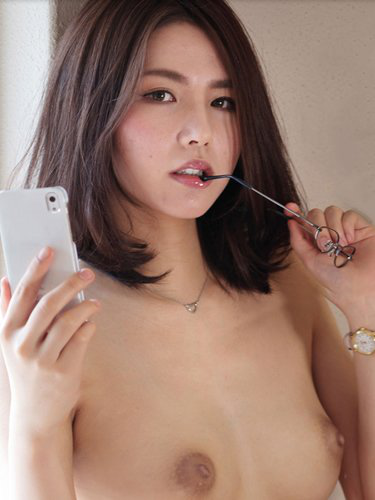


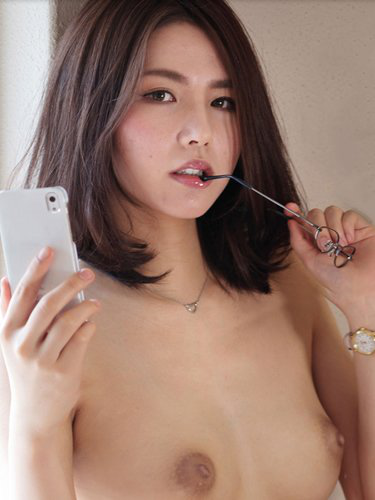

In [24]:
df_hips_max = df_bwh[df_bwh['Hips'] == 97]
print(df_hips_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_hips_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

170    葵ちひろ
Name: Name, dtype: object



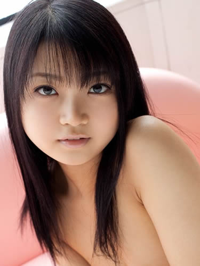


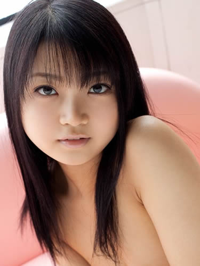

In [25]:
df_hips_min= df_bwh[df_bwh['Hips'] == 75]
print(df_hips_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_hips_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=200)

# EDA Height

In [26]:
df_height = df_ja[['Name', 'Image_URL', 'Height']]
df_height.drop(df_height.index[df_height["Height"].apply(lambda x: not (x.strip().isnumeric()))], axis=0, inplace=True)

df_height['Height'] = df_height['Height'].fillna(-1).astype(np.float32).replace(-1, np.nan)

print(df_height.shape)
df_height.head()

(1163, 3)


,Name,Image_URL,Height
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,168.0
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,169.0
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,156.0
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,149.0
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,153.0


In [27]:
dist_data = np.array(df_height['Height'])
dist_data = [x for x in dist_data if np.isnan(x) == False]
fig = ff.create_distplot([dist_data], group_labels = ['Height'])
fig.update_layout(margin=dict(t=30, b=30, l=30, r=30))
fig.show()

In [28]:
# plot violin chart for Height feature
fig = go.Figure(data=go.Violin(
                                y=df_height['Height'], 
                                box_visible=True, 
                                line_color='green',
                                meanline_visible=True, 
                                opacity=0.5,
                                x0='Height',
                                points='all'
                            )
                )

fig.update_layout(
                    height=600,
                    margin=dict(t=30, b=30, l=30, r=30)
                )
fig.show()

214    佐藤エル
594    司ミコト
Name: Name, dtype: object



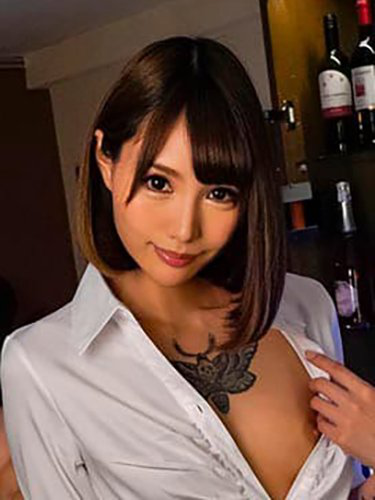
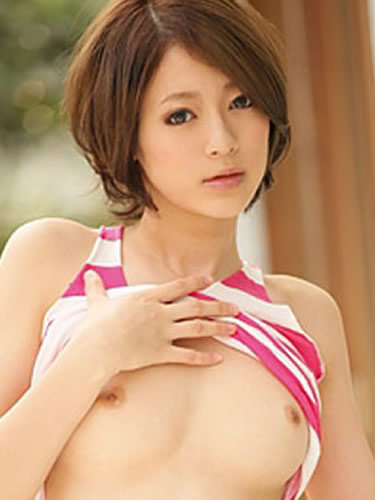


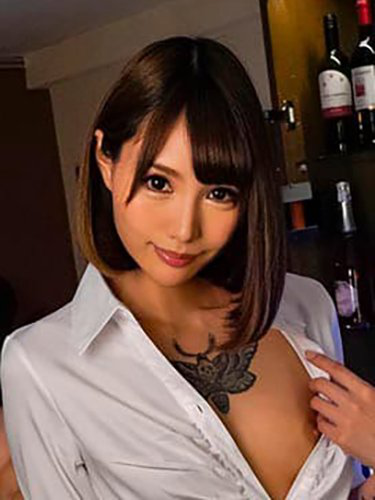
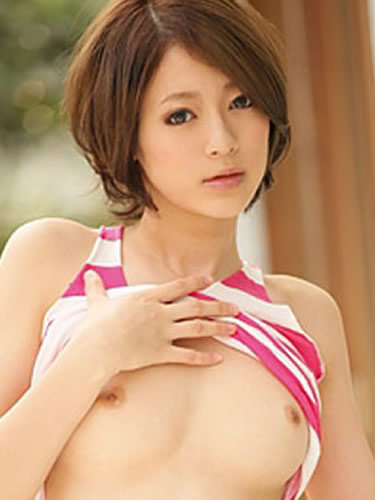

In [29]:
df_height_max = df_height[df_height['Height'] == 178]
print(df_height_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_height_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

456    工藤ララ
Name: Name, dtype: object



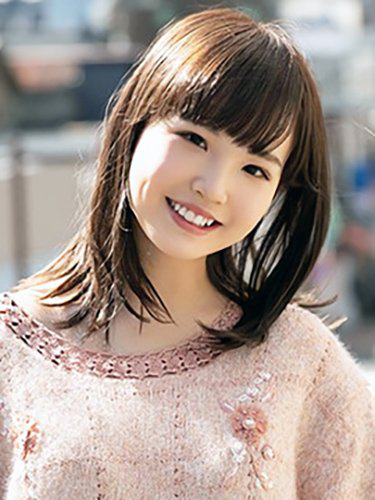


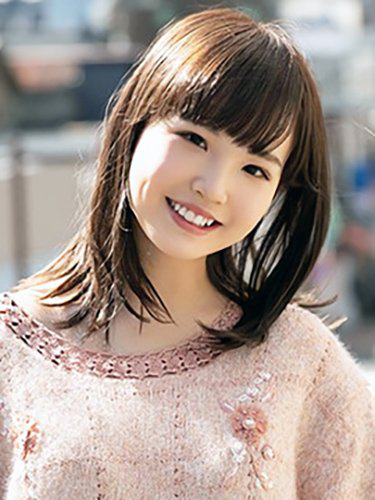

In [30]:
df_height_min = df_height[df_height['Height'] == 142]
print(df_height_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_height_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

# EDA Hips size

In [31]:
# df_hips = df_ja[['Name', 'Image_URL', 'Hips']]
# df_hips.drop(df_hips.index[df_hips["Hips"].apply(lambda x: (pd.isna(x)))], axis=0, inplace=True)

# df_hips['Hips'] = df_hips['Hips'].fillna(-1).astype(np.float32).replace(-1, np.nan)

# print(df_hips.shape)
# df_hips.head()

In [32]:
# fig = px.violin(
#                 df_hips, 
#                 y='Hips', 
#                 box=True, 
#                 points='all', 
#                 labels={'Hips':'Hips Size'})
# fig.show()

# EDA Cup size

In [33]:
df_cup = df_ja[['Name', 'Image_URL', 'Cup_Size']]
df_cup.drop(df_cup.index[df_cup["Cup_Size"].apply(lambda x: (pd.isna(x)))], axis=0, inplace=True)
print(df_cup.shape)
df_cup.head()

(342, 3)


,Name,Image_URL,Cup_Size
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,C
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,D
7,成田愛,https://javmodel.com/javdata/uploads/ai_narita...,D
8,佐山愛,https://javmodel.com/javdata/uploads/ai_sayama...,H
9,上原亜衣,https://javmodel.com/javdata/uploads/ai_uehara...,E


In [34]:
df_cup_gr = df_cup.groupby('Cup_Size')['Name'].count()
df_cup_gr = df_cup_gr.to_frame()
df_cup_gr.columns = ['Count']
df_cup_gr = df_cup_gr.sort_values('Count', ascending=False)
df_cup_gr.style.background_gradient(cmap='plasma_r')

,Count
Cup_Size,
D,73
E,61
F,61
C,45
G,40
H,23
B,15
I,11
J,6


In [35]:
fig = px.bar(
                df_cup_gr,
                x=df_cup_gr.index,
                y='Count',
                color='Count',
                text='Count',
                width=1400
                )
fig.update_layout(margin=dict(t=30, b=30, l=30, r=30))
fig.show()

759    きみの奈津
Name: Name, dtype: object



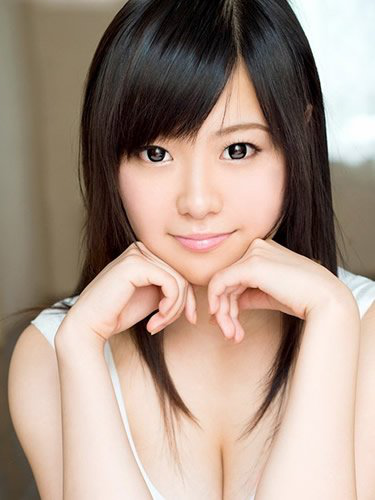


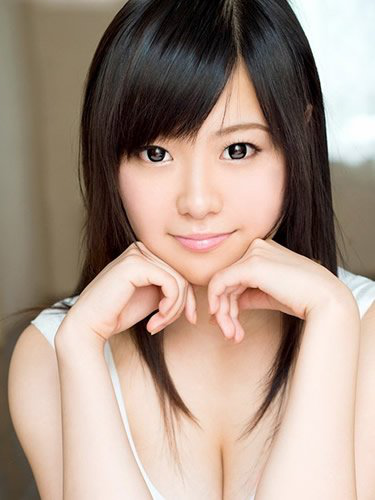

In [36]:
df_cup_size_max = df_cup[df_cup['Cup_Size'] == 'L']
print(df_cup_size_max.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_cup_size_max['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

124    ほしのあすか
Name: Name, dtype: object



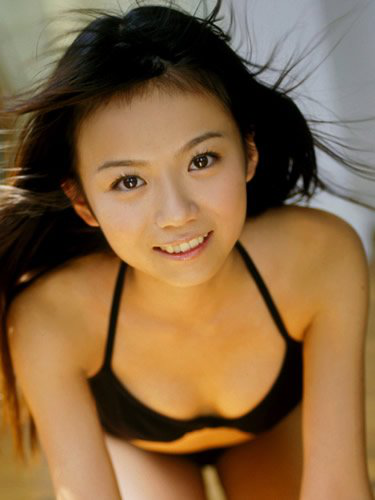


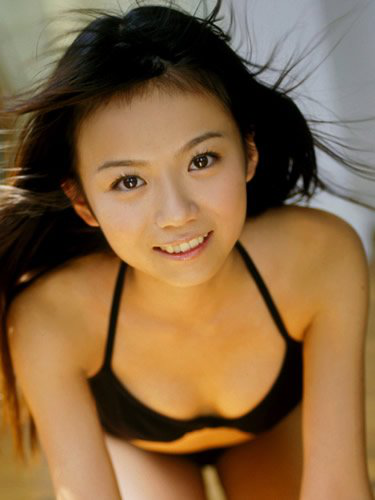

In [37]:
df_cup_size_min = df_cup[df_cup['Cup_Size'] == 'A']
print(df_cup_size_min.Name)
ims = [Image.open(requests.get(url, stream=True).raw) for url in df_cup_size_min['Image_URL']]
ipyplot.plot_images(ims, max_images=20, img_width=375)

# EDA Blood type

In [38]:
df_blood = df_ja[['Name', 'Image_URL', 'Blood_Type']]
df_blood.drop(df_blood.index[df_blood["Blood_Type"].apply(lambda x: x not in ['O', 'A', 'B', 'AB'])], axis=0, inplace=True)
print(df_blood.shape)
df_blood.head()

(605, 3)


,Name,Image_URL,Blood_Type
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,O
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,O
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,O
6,向井藍,https://javmodel.com/javdata/uploads/ai_mukai1...,B
7,成田愛,https://javmodel.com/javdata/uploads/ai_narita...,O


In [39]:
df_blood_gr = df_blood.groupby('Blood_Type')['Name'].count()
df_blood_gr = df_blood_gr.to_frame()
df_blood_gr.columns = ['Count']
df_blood_gr = df_blood_gr.sort_values('Count', ascending=False)
df_blood_gr.style.background_gradient(cmap='plasma_r')

,Count
Blood_Type,
A,245
O,236
B,76
AB,48


In [40]:
fig = px.bar(
                df_blood_gr,
                x=df_blood_gr.index,
                y='Count',
                color='Count',
                text='Count'
            )
fig.update_layout(margin=dict(t=30, b=30, l=30, r=30))
fig.show()

# EDA Hobby

In [41]:
df_hobby = df_ja[df_ja['Hobby'].notnull()]
hobby_str = ' '.join(df_hobby['Hobby'])
font_path = 'font/NotoSerifCJKjp-Light.otf'
mask = np.array(Image.open('heart_mask.jpg'))

stopwords = set(STOPWORDS)
stopwords.add("です")
stopwords.add("する")

In [42]:
# create a wordcloud 
wordcloud = WordCloud(background_color='white',
               mask=mask,
               font_path=font_path,
            #    collocations=False,
            #    width=600,
            #    height=300,
               max_words=2000,
               contour_width=2,
               contour_color='steelblue',
               stopwords=stopwords,
               max_font_size=500
               ).generate(hobby_str)
wordcloud.to_file("alice.png")

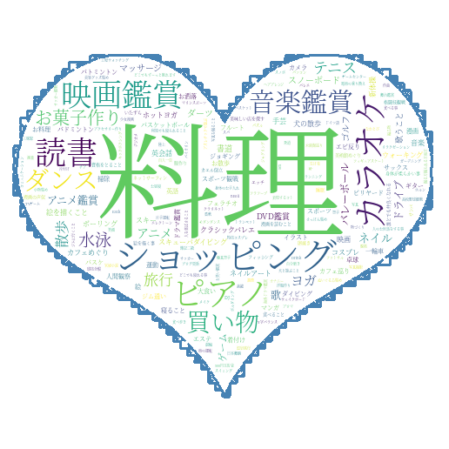

In [43]:
plt.figure(figsize=(8,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
# image = wordcloud.to_image()
# image.show()

# Analyis birth place

In [44]:
df_birthplace = df_ja[df_ja['Home_Town'].notnull()]
df_birthplace['Home_Town'].unique()

array(['埼玉県', '東京都', '秋田県', '神奈川県', '大阪府', '奈良県', '群馬県', '北海道', '兵庫県',
       '栃木県', 'イギリス', '新潟県', '岡山県', '宮崎県', '千葉県', '岐阜県', '広島県', '静岡県',
       '福岡県', 'スペイン', '島根県', '岩手県', '佐賀県', '愛知県', '青森県', 'ロサンゼルス', '宮城県',
       '山形県', '京都府', '滋賀県', '富山県', '長崎県', '神奈川', '鳥取県', '愛媛県', '長野県',
       '南の島', '山梨県', '山口県', '鹿児島県', '東京', '福井県'], dtype=object)

In [45]:
df_birthplace = df_birthplace['Home_Town'].value_counts().reset_index()
df_birthplace.columns = ['Home_Town', 'Count']
df_birthplace.head().style.background_gradient(cmap='plasma_r')

,Home_Town,Count
0,東京都,124
1,神奈川県,41
2,千葉県,16
3,北海道,11
4,埼玉県,9


In [46]:
# get latitude & longitude
geolocator = Nominatim(user_agent='Home_Town')
df_birthplace['Home_Town Coord'] = df_birthplace['Home_Town'].apply(geolocator.geocode).apply(lambda x: (x.latitude, x.longitude))
df_birthplace.head().style.background_gradient(cmap='plasma_r')

,Home_Town,Count,Home_Town Coord
0,東京都,124,"(35.6828387, 139.7594549)"
1,神奈川県,41,"(35.4342935, 139.374753)"
2,千葉県,16,"(35.549399, 140.2647303)"
3,北海道,11,"(43.4519831, 142.8197834)"
4,埼玉県,9,"(35.9754168, 139.4160114)"


In [47]:
# separate latitude & longtitude into 2 different columns
df_birthplace[['Latitude', 'Longtitude']] = df_birthplace['Home_Town Coord'].apply(pd.Series)
df_birthplace.drop(['Home_Town Coord'], axis=1, inplace=True)
df_birthplace.head()

,Home_Town,Count,Latitude,Longtitude
0,東京都,124,35.682839,139.759455
1,神奈川県,41,35.434294,139.374753
2,千葉県,16,35.549399,140.264730
3,北海道,11,43.451983,142.819783
4,埼玉県,9,35.975417,139.416011


In [48]:
hm_data = df_birthplace[['Latitude', 'Longtitude', 'Count']]
hm_data = hm_data.values.tolist()
hm_data[:5]

[[35.6828387, 139.7594549, 124.0],
 [35.4342935, 139.374753, 41.0],
 [35.549399, 140.2647303, 16.0],
 [43.4519831, 142.8197834, 11.0],
 [35.9754168, 139.4160114, 9.0]]

In [49]:
hmap = folium.Map(location=[35.9, 139.8], control_scale=True, attr='USGS style', zoom_start=5)
HeatMap(hm_data, rasdius=10).add_to(hmap)
hmap

# EDA Relationship between Age and Breast size, Waist size and Hip size

In [61]:
df_abwh = df_age.merge(df_bwh, on='Name', how='left')
print(df_abwh.shape)
df_abwh.head()

(1143, 9)


,Name,Image_URL_x,Birthday,Age,Zodiac_Sign,Image_URL_y,Breast_Size,Waist_Size,Hips
0,浅倉愛,https://javmodel.com/javdata/uploads/ai_asakur...,1993-10-28,28,Scorpio,https://javmodel.com/javdata/uploads/ai_asakur...,83.0,60.0,83.0
1,羽田あい,https://javmodel.com/javdata/uploads/ai_haneda...,1989-09-22,32,Virgo,https://javmodel.com/javdata/uploads/ai_haneda...,87.0,55.0,85.0
2,星奈あい,https://javmodel.com/javdata/uploads/ai_hoshin...,1995-10-29,26,Scorpio,https://javmodel.com/javdata/uploads/ai_hoshin...,83.0,59.0,NaN
3,河奈亜依,https://javmodel.com/javdata/uploads/ai_kawana...,1998-03-18,23,Pisces,https://javmodel.com/javdata/uploads/ai_kawana...,80.0,56.0,NaN
4,皆野あい,https://javmodel.com/javdata/uploads/ai_minano...,1995-05-15,26,Taurus,https://javmodel.com/javdata/uploads/ai_minano...,86.0,58.0,NaN


In [62]:
df_abwh.drop(['Name', 'Image_URL_x', 'Image_URL_y', 'Birthday', 'Zodiac_Sign'], axis=1, inplace=True)
df_abwh.rename(columns={'Image_URL_x': 'Image_URL'}, inplace=True)
df_abwh.head()

,Age,Breast_Size,Waist_Size,Hips
0,28,83.0,60.0,83.0
1,32,87.0,55.0,85.0
2,26,83.0,59.0,NaN
3,23,80.0,56.0,NaN
4,26,86.0,58.0,NaN


In [63]:
df_abwh['Age_Gr'] = pd.cut(df_abwh['Age'], bins=[15, 30, 40, float('Inf')], labels=['A', 'B', 'C'])
df_abwh.head()

,Age,Breast_Size,Waist_Size,Hips,Age_Gr
0,28,83.0,60.0,83.0,A
1,32,87.0,55.0,85.0,B
2,26,83.0,59.0,NaN,A
3,23,80.0,56.0,NaN,A
4,26,86.0,58.0,NaN,A


In [66]:
fig = go.Figure()
age_cat = ['A', 'B', 'C']
for ac in age_cat:
    fig.add_trace(go.Violin(
                                x=df_abwh['Age_Gr'][df_abwh['Age_Gr'] == ac],
                                y=df_abwh['Breast_Size'][df_abwh['Age_Gr'] == ac],
                                text='Dist plot for ' + ac.upper(),
                                name=ac.upper(),
                                box_visible=True,
                                meanline_visible=True,
                                points='all', 
                            ))
fig.update_layout(
                    margin=dict(t=30, b=30, l=30, r=30), 
                    title_text='Age & Breast_Size'
                )
fig.show()

In [59]:
fig = go.Figure()
age_cat = ['A', 'B', 'C']
for ac in age_cat:
    fig.add_trace(go.Violin(x=df_abwh['Age_Gr'][df_abwh['Age_Gr'] == ac],
                            y=df_abwh['Waist_Size'][df_abwh['Age_Gr'] == ac],
                            text='Dist plot for ' + ac.upper(),
                            name=ac.upper(),
                            box_visible=True,
                            meanline_visible=True,
                            points='all'))

fig.show()

In [60]:
fig = go.Figure()
age_cat = ['A', 'B', 'C']
for ac in age_cat:
    fig.add_trace(go.Violin(x=df_abwh['Age_Gr'][df_abwh['Age_Gr'] == ac],
                            y=df_abwh['Hips'][df_abwh['Age_Gr'] == ac],
                            text='Dist plot for ' + ac.upper(),
                            name=ac.upper(),
                            box_visible=True,
                            meanline_visible=True,
                            points='all'))

fig.show()